In [1]:
import sys, os

import warnings
warnings.filterwarnings('ignore')

# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
from sklearn.model_selection import train_test_split

# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd

from PIL import Image
from tensorflow.keras import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D,UpSampling2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape,ZeroPadding2D,Input,Activation
import tensorflow as tf

## Loading and pre-processing audio data:

In [2]:
general_songs_path = r'C:\Users\weldl\Datasets\gtzan-dataset-music-genre-classification'
genres_list = os.listdir(f'{general_songs_path}/genres_original/')
print(genres_list)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [3]:
all_songs = []
for genre in genres_list:
    for song_name in os.listdir(os.path.join(f'{general_songs_path}/genres_original/', genre)):
        all_songs.append(os.path.join(f'{general_songs_path}/genres_original/', genre, song_name))
print('all_songs:', len(all_songs))

all_songs: 1000


In [4]:
def get_spectogram_data(songs_array):
    spec_array = []
    for song_name in songs_array:
        y, sr = librosa.load(song_name)
        y, _ = librosa.effects.trim(y)
        S = librosa.feature.melspectrogram(y, sr=sr)
        S_DB = (librosa.amplitude_to_db(S, ref=np.max)+80)/80
        try:
            spec_array.append(S_DB[:, 0:1210].reshape((128, 1210, 1)))
        except ValueError:
            print(S_DB.shape)
    return np.array(spec_array)

spec_data = get_spectogram_data(all_songs[:])
print(spec_data[0].min(), spec_data[0].max())
spec_data.shape

0.0 1.0


(1000, 128, 1210, 1)

In [5]:
SPEC_SHAPE = spec_data.shape[1:]

In [6]:
spec_data_train, spec_data_test = train_test_split(spec_data, test_size=0.1, random_state=42)

print('train samples:', spec_data_train.shape)
print('test samples:', spec_data_test.shape)

train samples: (900, 128, 1210, 1)
test samples: (100, 128, 1210, 1)


## Loading and pre-processing images:

In [7]:
# general_imgs_path = r'C:\Users\weldl\Datasets\Album Covers Images'
general_imgs_path = r'C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba'

for dirname, _, filenames in os.walk(general_imgs_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000001.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000002.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000003.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000004.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000005.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000006.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000007.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000008.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000009.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000010.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000011.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\000

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049077.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049078.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049079.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049080.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049081.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049082.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049083.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049084.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049085.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049086.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\049087.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\04

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103859.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103860.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103861.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103862.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103863.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103864.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103865.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103866.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103867.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103868.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103869.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\103

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158098.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158099.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158100.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158101.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158102.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158103.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158104.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158105.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158106.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158107.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\158108.jpg
C:\Users\weldl\Datasets\celeba-dataset\img_align_celeba\img_align_celeba\15

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [8]:
imgs_paths = []
for path in os.listdir(general_imgs_path):
    if '.jpg' in path:
        imgs_paths.append(os.path.join(general_imgs_path, path))

In [9]:
imgs_paths_train = imgs_paths[0:10000]
len(imgs_paths_train)

10000

In [10]:
IMG_SHAPE = (64, 64)

crop = (30, 55, 150, 175) #croping size for the image so that only the face at centre is obtained
images = [np.array((Image.open(path).crop(crop)).resize(IMG_SHAPE)) for path in imgs_paths_train]
# images = [np.array(Image.open(path).resize(IMG_SHAPE)) for path in imgs_paths_train]

for i in range(len(images)):
#     images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    images[i] = ((images[i] - 127.5)/127.5)
    #images[i] = images[i]*2-1  #uncomment this if activation is tanh for generator last layer

images = np.array(images)
print(images.min(), images.max())

-1.0 1.0


In [11]:
train_data=images
train_data.shape

(10000, 64, 64, 3)

In [12]:
IMG_SHAPE = train_data.shape[1:]
IMG_SHAPE

(64, 64, 3)

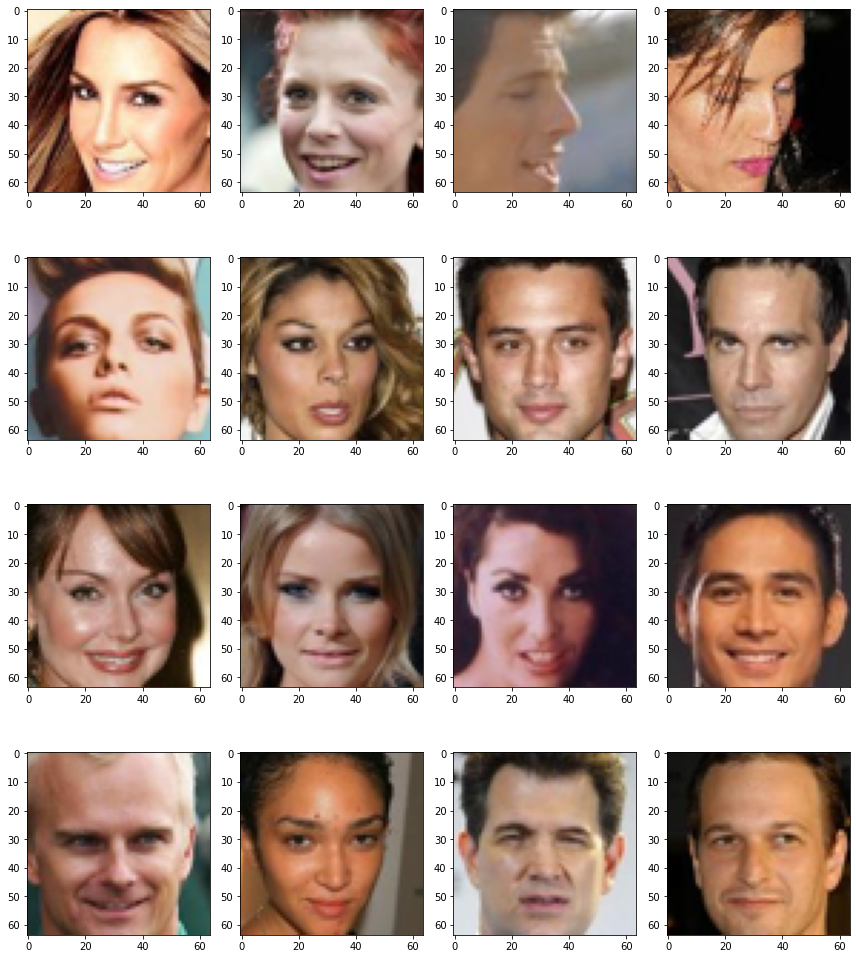

In [13]:
# Images Visualization:
   
def plot_img_samples(img_array, figsize=(12, 14), title=None, subplot_dim=(4, 4)):
    plt.figure(figsize=figsize)
    if title:
        plt.title(title)
    idx=0
    for i in range(subplot_dim[0]):
        for j in range(subplot_dim[1]):
                plt.subplot(subplot_dim[0], subplot_dim[1], i*4 + j +1)
                img_array_ = (img_array[idx]+1) * 127.5
                plt.imshow(img_array_.astype(int))
                idx+=1
    plt.tight_layout()
    plt.show()

plot_img_samples(train_data)

In [14]:
X_train = train_data
X_train.shape

(10000, 64, 64, 3)

# **Generator**

In [15]:
noise_shape = 100

In [16]:
def make_encoder_model(input_shape=(64,64, 3), output_len=100):
    encoder = Sequential()
    encoder.add(Conv2D(32, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Conv2D(16, (3,3), strides=(2, 2), padding='same'))
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Conv2D(8, (3,3), strides=(2, 2), padding='same'))
    encoder.add(Flatten())
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Dense(output_len))
    return encoder

encoder = make_encoder_model(input_shape=SPEC_SHAPE, output_len=noise_shape)
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 605, 32)       320       
_________________________________________________________________
batch_normalization (BatchNo (None, 64, 605, 32)       128       
_________________________________________________________________
dropout (Dropout)            (None, 64, 605, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 303, 16)       4624      
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 303, 16)       64        
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 303, 16)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 152, 8)        1

In [17]:
samples = np.array(encoder(spec_data[0:2]))
print(samples.min(), samples.max())

-0.21318999 0.19246124


In [18]:
def build_generator(noise_size, channels):
    GENERATE_RES=2
    model = Sequential()
    model.add(Dense(4 * 4 * 256, activation="relu", input_dim=noise_size))
    model.add(Reshape((4, 4, 256)))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    for i in range(GENERATE_RES):
         model.add(UpSampling2D())
         model.add(Conv2D(256, kernel_size=3, padding="same"))
         model.add(BatchNormalization(momentum=0.8))
         model.add(Activation("relu"))
#     model.summary()
    model.add(Conv2D(channels, kernel_size=3, padding="same"))
    model.add(Activation('tanh'))
#     input = Input(shape=(noise_size,))
#     generated_image = model(input)
    
    return model

generator_ = build_generator(noise_shape, channels=IMG_SHAPE[-1])
generator_.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 256)         590080    
_________________________________________________________________
batch_normalization_3 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
activation (Activation)      (None, 8, 8, 256)         0         
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 16, 16, 256)      

In [19]:
# Adding the encoder to the model:
generator = Sequential([encoder, generator_])
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 100)               2029820   
_________________________________________________________________
sequential_1 (Sequential)    (None, 64, 64, 3)         2785027   
Total params: 4,814,847
Trainable params: 4,773,791
Non-trainable params: 41,056
_________________________________________________________________


# **Discriminator**

In [20]:
def build_discriminator(input_shape):
    model = Sequential()
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    model.add(Conv2D(32, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

discriminator = build_discriminator(IMG_SHAPE)
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 16, 16, 32)        18464     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)             

# **DCGAN (combined model)**

In [21]:
GAN = Sequential([generator,discriminator])

In [22]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [23]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [24]:
GAN.layers

In [25]:
GAN.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 64, 64, 3)         4814847   
_________________________________________________________________
sequential_3 (Sequential)    (None, 1)                 28449     
Total params: 4,843,296
Trainable params: 4,773,791
Non-trainable params: 69,505
_________________________________________________________________


# **Training**

In [26]:
epochs = 100  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 64

In [27]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


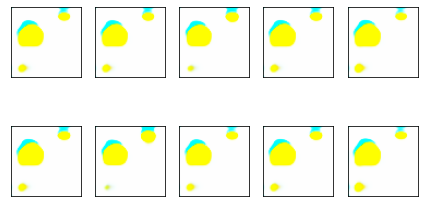

Epoch: 1,  Loss: D_real = 0.024, D_fake = 0.007,  G = 0.008
Currently on Epoch 2
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 2,  Loss: D_real = 0.020, D_fake = 0.007,  G = 5.444
Currently on Epoch 3
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 3,  Loss: D_real = 0.048, D_fake = 0.029,  G = 5.502
Currently on Epoch 4
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 4,  Loss: D_real = 0.148, D_fake = 0.053,  G = 0.559
Currently on Epoch 5
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 5,  Loss: D_real = 0.077, D_fake = 0.093,  G = 2.908
Currently on Epoch 6
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


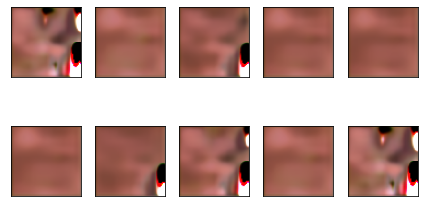

Epoch: 6,  Loss: D_real = 0.228, D_fake = 0.325,  G = 1.910
Currently on Epoch 7
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 7,  Loss: D_real = 0.240, D_fake = 0.016,  G = 5.618
Currently on Epoch 8
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 8,  Loss: D_real = 0.496, D_fake = 0.226,  G = 2.425
Currently on Epoch 9
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 9,  Loss: D_real = 0.126, D_fake = 0.139,  G = 4.873
Currently on Epoch 10
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 10,  Loss: D_real = 0.166, D_fake = 0.118,  G = 2.548
Currently on Epoch 11
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


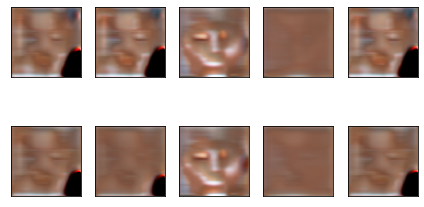

Epoch: 11,  Loss: D_real = 0.158, D_fake = 0.177,  G = 0.990
Currently on Epoch 12
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 12,  Loss: D_real = 0.647, D_fake = 0.172,  G = 0.567
Currently on Epoch 13
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 13,  Loss: D_real = 0.537, D_fake = 0.062,  G = 3.855
Currently on Epoch 14
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 14,  Loss: D_real = 0.067, D_fake = 0.102,  G = 4.378
Currently on Epoch 15
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 15,  Loss: D_real = 1.055, D_fake = 0.829,  G = 0.084
Currently on Epoch 16
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


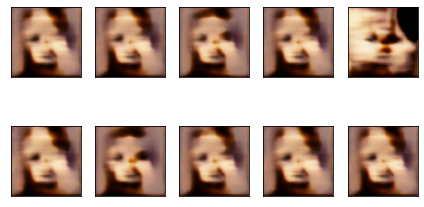

Epoch: 16,  Loss: D_real = 0.438, D_fake = 0.203,  G = 3.301
Currently on Epoch 17
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 17,  Loss: D_real = 0.416, D_fake = 0.433,  G = 3.468
Currently on Epoch 18
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 18,  Loss: D_real = 0.239, D_fake = 0.125,  G = 3.580
Currently on Epoch 19
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 19,  Loss: D_real = 0.366, D_fake = 0.149,  G = 1.964
Currently on Epoch 20
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 20,  Loss: D_real = 0.784, D_fake = 0.091,  G = 8.282
Currently on Epoch 21
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


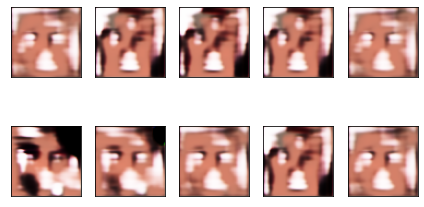

Epoch: 21,  Loss: D_real = 0.244, D_fake = 0.149,  G = 6.046
Currently on Epoch 22
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 22,  Loss: D_real = 0.210, D_fake = 0.269,  G = 2.623
Currently on Epoch 23
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 23,  Loss: D_real = 0.263, D_fake = 0.164,  G = 3.252
Currently on Epoch 24
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 24,  Loss: D_real = 0.268, D_fake = 0.244,  G = 2.424
Currently on Epoch 25
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 25,  Loss: D_real = 0.198, D_fake = 0.230,  G = 3.815
Currently on Epoch 26
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


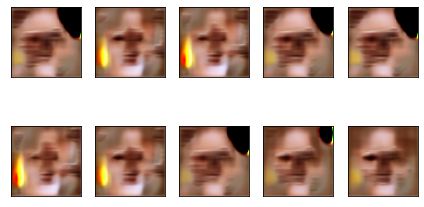

Epoch: 26,  Loss: D_real = 0.183, D_fake = 0.543,  G = 1.702
Currently on Epoch 27
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 27,  Loss: D_real = 0.368, D_fake = 0.298,  G = 5.131
Currently on Epoch 28
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 28,  Loss: D_real = 0.691, D_fake = 0.235,  G = 2.272
Currently on Epoch 29
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 29,  Loss: D_real = 0.283, D_fake = 0.107,  G = 2.579
Currently on Epoch 30
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 30,  Loss: D_real = 0.377, D_fake = 0.186,  G = 3.178
Currently on Epoch 31
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


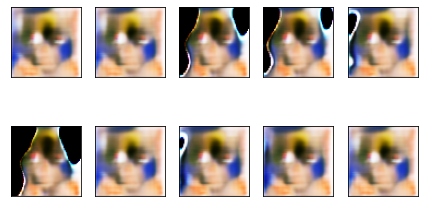

Epoch: 31,  Loss: D_real = 0.355, D_fake = 0.100,  G = 5.892
Currently on Epoch 32
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 32,  Loss: D_real = 0.399, D_fake = 0.105,  G = 4.927
Currently on Epoch 33
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 33,  Loss: D_real = 0.657, D_fake = 0.072,  G = 2.732
Currently on Epoch 34
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 34,  Loss: D_real = 0.205, D_fake = 0.613,  G = 1.642
Currently on Epoch 35
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 35,  Loss: D_real = 0.324, D_fake = 0.171,  G = 3.214
Currently on Epoch 36
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


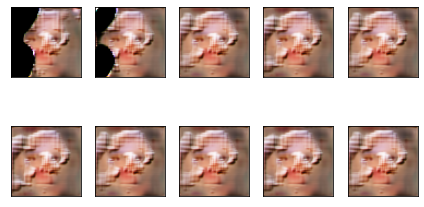

Epoch: 36,  Loss: D_real = 0.326, D_fake = 0.365,  G = 1.223
Currently on Epoch 37
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 37,  Loss: D_real = 0.473, D_fake = 0.458,  G = 4.820
Currently on Epoch 38
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 38,  Loss: D_real = 0.682, D_fake = 0.158,  G = 4.612
Currently on Epoch 39
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 39,  Loss: D_real = 0.049, D_fake = 0.107,  G = 1.141
Currently on Epoch 40
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 40,  Loss: D_real = 0.148, D_fake = 0.032,  G = 10.750
Currently on Epoch 41
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


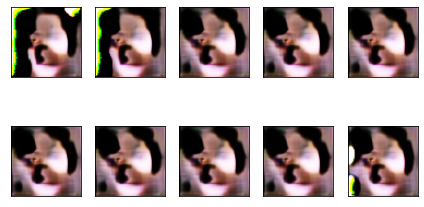

Epoch: 41,  Loss: D_real = 0.517, D_fake = 0.199,  G = 7.606
Currently on Epoch 42
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 42,  Loss: D_real = 0.001, D_fake = 0.473,  G = 13.917
Currently on Epoch 43
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 43,  Loss: D_real = 0.670, D_fake = 0.253,  G = 13.484
Currently on Epoch 44
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 44,  Loss: D_real = 0.290, D_fake = 0.414,  G = 5.392
Currently on Epoch 45
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 45,  Loss: D_real = 0.906, D_fake = 0.502,  G = 2.287
Currently on Epoch 46
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


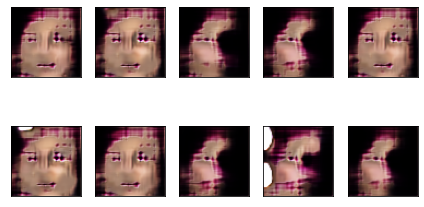

Epoch: 46,  Loss: D_real = 0.735, D_fake = 0.519,  G = 4.170
Currently on Epoch 47
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 47,  Loss: D_real = 0.271, D_fake = 0.234,  G = 2.602
Currently on Epoch 48
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 48,  Loss: D_real = 0.678, D_fake = 0.175,  G = 3.653
Currently on Epoch 49
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 49,  Loss: D_real = 0.404, D_fake = 0.048,  G = 5.097
Currently on Epoch 50
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 50,  Loss: D_real = 0.868, D_fake = 0.356,  G = 3.615
Currently on Epoch 51
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


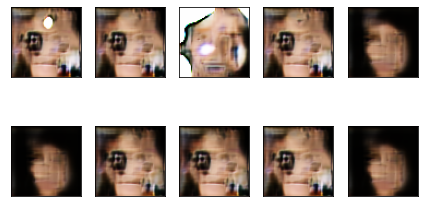

Epoch: 51,  Loss: D_real = 0.889, D_fake = 0.209,  G = 4.988
Currently on Epoch 52
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 52,  Loss: D_real = 0.355, D_fake = 0.196,  G = 2.978
Currently on Epoch 53
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 53,  Loss: D_real = 0.937, D_fake = 0.363,  G = 4.699
Currently on Epoch 54
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 54,  Loss: D_real = 0.607, D_fake = 0.494,  G = 3.058
Currently on Epoch 55
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 55,  Loss: D_real = 0.669, D_fake = 0.299,  G = 2.410
Currently on Epoch 56
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


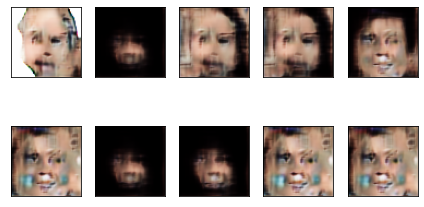

Epoch: 56,  Loss: D_real = 0.580, D_fake = 0.613,  G = 2.101
Currently on Epoch 57
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 57,  Loss: D_real = 0.774, D_fake = 0.445,  G = 1.910
Currently on Epoch 58
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 58,  Loss: D_real = 0.176, D_fake = 0.351,  G = 2.453
Currently on Epoch 59
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 59,  Loss: D_real = 0.559, D_fake = 0.203,  G = 3.683
Currently on Epoch 60
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 60,  Loss: D_real = 0.225, D_fake = 0.579,  G = 2.933
Currently on Epoch 61
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


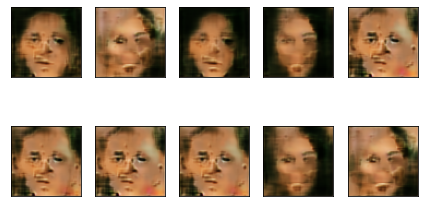

Epoch: 61,  Loss: D_real = 0.320, D_fake = 0.674,  G = 1.916
Currently on Epoch 62
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 62,  Loss: D_real = 0.533, D_fake = 0.467,  G = 1.254
Currently on Epoch 63
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 63,  Loss: D_real = 0.348, D_fake = 0.228,  G = 2.305
Currently on Epoch 64
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 64,  Loss: D_real = 0.704, D_fake = 0.288,  G = 3.608
Currently on Epoch 65
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 65,  Loss: D_real = 0.592, D_fake = 0.653,  G = 2.168
Currently on Epoch 66
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


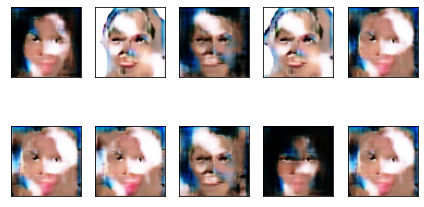

Epoch: 66,  Loss: D_real = 0.444, D_fake = 0.656,  G = 3.016
Currently on Epoch 67
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 67,  Loss: D_real = 0.453, D_fake = 0.376,  G = 1.489
Currently on Epoch 68
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 68,  Loss: D_real = 0.740, D_fake = 0.332,  G = 1.225
Currently on Epoch 69
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 69,  Loss: D_real = 0.609, D_fake = 0.811,  G = 1.763
Currently on Epoch 70
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 70,  Loss: D_real = 0.953, D_fake = 0.506,  G = 1.585
Currently on Epoch 71
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


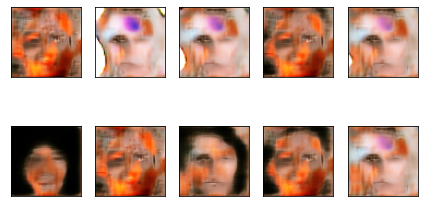

Epoch: 71,  Loss: D_real = 0.927, D_fake = 0.564,  G = 1.694
Currently on Epoch 72
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 72,  Loss: D_real = 0.278, D_fake = 0.340,  G = 1.207
Currently on Epoch 73
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 73,  Loss: D_real = 0.367, D_fake = 0.807,  G = 1.677
Currently on Epoch 74
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 74,  Loss: D_real = 0.862, D_fake = 0.511,  G = 1.806
Currently on Epoch 75
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 75,  Loss: D_real = 0.539, D_fake = 0.257,  G = 2.159
Currently on Epoch 76
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


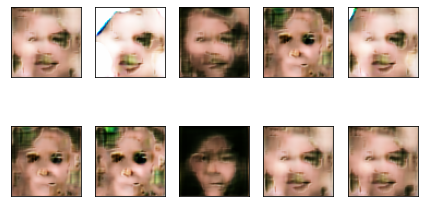

Epoch: 76,  Loss: D_real = 1.071, D_fake = 0.461,  G = 1.703
Currently on Epoch 77
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 77,  Loss: D_real = 0.664, D_fake = 0.620,  G = 1.581
Currently on Epoch 78
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 78,  Loss: D_real = 0.627, D_fake = 0.548,  G = 1.277
Currently on Epoch 79
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 79,  Loss: D_real = 0.336, D_fake = 0.504,  G = 1.166
Currently on Epoch 80
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 80,  Loss: D_real = 0.612, D_fake = 0.556,  G = 1.720
Currently on Epoch 81
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


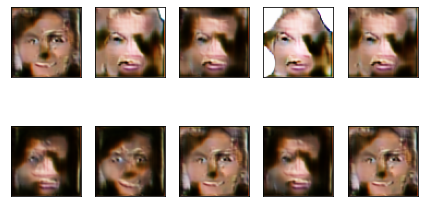

Epoch: 81,  Loss: D_real = 1.015, D_fake = 0.707,  G = 1.268
Currently on Epoch 82
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 82,  Loss: D_real = 0.752, D_fake = 0.593,  G = 1.493
Currently on Epoch 83
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 83,  Loss: D_real = 0.797, D_fake = 0.418,  G = 2.533
Currently on Epoch 84
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 84,  Loss: D_real = 0.370, D_fake = 0.428,  G = 1.080
Currently on Epoch 85
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 85,  Loss: D_real = 0.589, D_fake = 0.474,  G = 1.897
Currently on Epoch 86
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


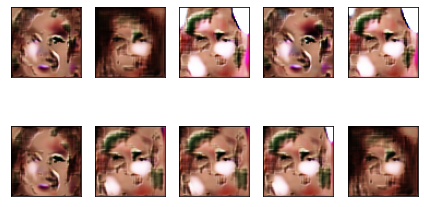

Epoch: 86,  Loss: D_real = 0.877, D_fake = 0.750,  G = 0.900
Currently on Epoch 87
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 87,  Loss: D_real = 0.699, D_fake = 0.462,  G = 2.618
Currently on Epoch 88
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 88,  Loss: D_real = 0.765, D_fake = 0.459,  G = 2.147
Currently on Epoch 89
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 89,  Loss: D_real = 0.891, D_fake = 0.674,  G = 2.050
Currently on Epoch 90
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 90,  Loss: D_real = 0.717, D_fake = 0.847,  G = 0.885
Currently on Epoch 91
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


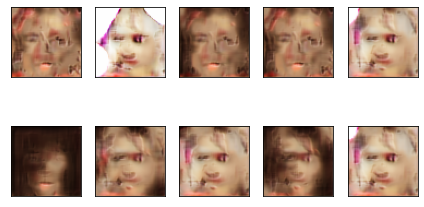

Epoch: 91,  Loss: D_real = 0.454, D_fake = 0.423,  G = 1.199
Currently on Epoch 92
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 92,  Loss: D_real = 0.534, D_fake = 0.514,  G = 2.427
Currently on Epoch 93
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 93,  Loss: D_real = 0.597, D_fake = 0.421,  G = 4.530
Currently on Epoch 94
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 94,  Loss: D_real = 0.460, D_fake = 0.399,  G = 2.409
Currently on Epoch 95
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 95,  Loss: D_real = 0.560, D_fake = 0.395,  G = 1.558
Currently on Epoch 96
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


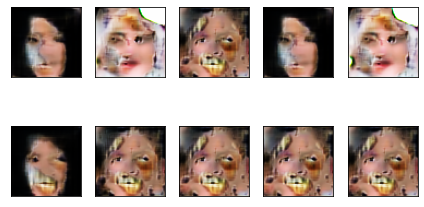

Epoch: 96,  Loss: D_real = 0.740, D_fake = 0.930,  G = 1.131
Currently on Epoch 97
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 97,  Loss: D_real = 0.773, D_fake = 0.431,  G = 1.828
Currently on Epoch 98
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 98,  Loss: D_real = 0.864, D_fake = 0.732,  G = 1.480
Currently on Epoch 99
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 99,  Loss: D_real = 0.519, D_fake = 0.520,  G = 1.161
Currently on Epoch 100
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 100,  Loss: D_real = 0.305, D_fake = 0.397,  G = 2.373
Training is complete


In [28]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")

        idxs = np.array([i for i in range(spec_data_train.shape[0])])
        idxs_select = np.random.choice(idxs, batch_size)
        img_noise = spec_data_train[idxs_select] + np.random.uniform(-0.1, 0.1,size=spec_data_train[idxs_select].shape)

        gen_image = generator.predict_on_batch(img_noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)

        idxs = np.array([i for i in range(spec_data_train.shape[0])])
        idxs_select = np.random.choice(idxs, batch_size)
        img_noise = spec_data_train[idxs_select] + np.random.uniform(-0.1, 0.1,size=spec_data_train[idxs_select].shape)

        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(img_noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
#         test_samples = np.random.normal(loc=0, scale=1, size=(samples,100))        
        idxs = np.array([i for i in range(spec_data_test.shape[0])])
        idxs_select = np.random.choice(idxs, samples)
        test_samples = spec_data_test[idxs_select]
        x_fake = generator.predict(test_samples)

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            img_array_ = (x_fake[k]+1) * 127.5
            plt.imshow(img_array_.astype(int))
            plt.xticks([])
            plt.yticks([])
        plt.tight_layout()
        plt.show()

    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

# **Output Visualization**

In [29]:
noise = spec_data_test

In [30]:
im=generator.predict(noise)

In [31]:
im.shape[0]

100

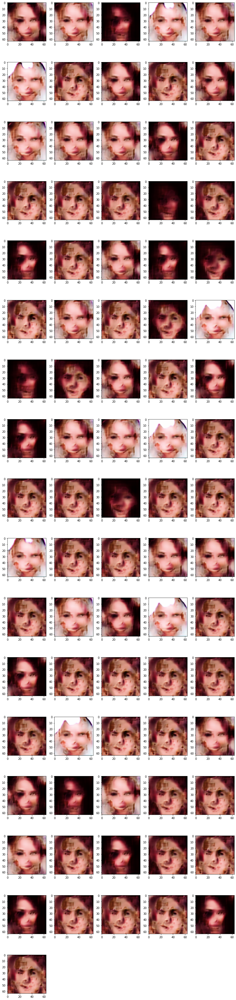

In [32]:
plot_img_samples(im, subplot_dim=(20, 5), figsize=(12, 60))

# **Loss Curve**

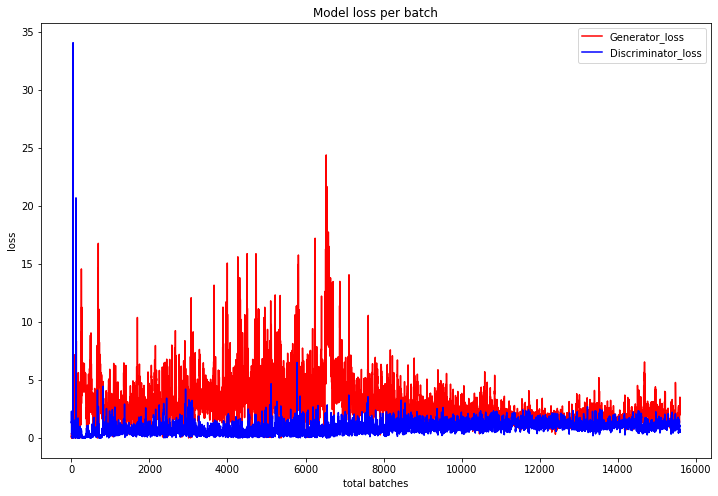

In [33]:
plt.figure(figsize=(12, 8))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()